# 1-2. Face Detection Demo
## 사용자 리뷰 이미지에서 얼굴 가려주기

### PIP install - image libray & Google Cloud Vision

In [17]:
%pip install opencv-python-headless --user
%pip install pillow --user

Note: you may need to restart the kernel to use updated packages.


Note: you may need to restart the kernel to use updated packages.


In [18]:
%pip install google-cloud-vision --user

Note: you may need to restart the kernel to use updated packages.


### Authentication

In [4]:
from google.oauth2.service_account import Credentials
credentials = Credentials.from_service_account_file('auth.json')

### Cloud Vision API call
#### https://cloud.google.com/vision/docs/detecting-faces

In [5]:
from google.cloud import vision

def detect_faces(path):
    """Detects faces in an image."""
    client = vision.ImageAnnotatorClient(credentials=credentials)

    with open(path, "rb") as image_file:
        content = image_file.read()

    image = vision.Image(content=content)

    response = client.face_detection(image=image)
    print(response)

    faces = response.face_annotations

    # Names of likelihood from google.cloud.vision.enums
    likelihood_name = (
        "UNKNOWN",
        "VERY_UNLIKELY",
        "UNLIKELY",
        "POSSIBLE",
        "LIKELY",
        "VERY_LIKELY",
    )
    print("Faces:")

    for face in faces:
        print(f"anger: {likelihood_name[face.anger_likelihood]}")
        print(f"joy: {likelihood_name[face.joy_likelihood]}")
        print(f"surprise: {likelihood_name[face.surprise_likelihood]}")

        vertices = [
            f"({vertex.x},{vertex.y})" for vertex in face.bounding_poly.vertices
        ]

        print("face bounds: {}".format(",".join(vertices)))

        right = float('-inf')
        bottom = float('-inf')
        left = float('inf')
        top = float('inf')

        for vertex in face.bounding_poly.vertices:
            right = max(right, vertex.x)
            bottom = max(bottom, vertex.y)
            left = min(left, vertex.x)
            top = min(top, vertex.y)


    if response.error.message:
        raise Exception(
            "{}\nFor more info on error messages, check: "
            "https://cloud.google.com/apis/design/errors".format(response.error.message)
        )

    return top, left, bottom, right

### Image handling functions


In [6]:
import cv2
import numpy as np
from PIL import Image

def resize_image(image_path, new_width):
    image = Image.open(image_path)
    width, height = image.size
    aspect_ratio = width / height
    new_height = int(new_width / aspect_ratio)
    resized_image = image.resize((new_width, new_height))

    return resized_image

def mosaic_image_area(input_image, top, left, bottom, right):
    tile_size = 3
    w = right-left
    h = bottom-top
    image = Image.open(input_image)
    # Crop the area where the mosaic will be applied
    mosaic_area = image.crop((left, top, right, bottom))

    # Convert ROI to OpenCV format (BGR)
    roi_array = cv2.cvtColor(np.array(mosaic_area), cv2.COLOR_RGB2BGR)

    # Make a smaller size and then bigger size
    roi_array = cv2.resize(roi_array, (w//tile_size, h//tile_size)) # 1/rate
    roi_array = cv2.resize(roi_array, (w,h), interpolation=cv2.INTER_AREA)
    # Convert blurred ROI back to PIL format
    mosaic_roi_image = Image.fromarray(cv2.cvtColor(roi_array, cv2.COLOR_BGR2RGB))

    # Paste the modified mosaic area back into the original image
    image.paste(mosaic_roi_image, (left, top))

    return image

def blur_image_area(input_image, top, left, bottom, right):
    image = Image.open(input_image)
    roi = image.crop((left, top, right, bottom))
    # Convert ROI to OpenCV format (BGR)
    roi_array = cv2.cvtColor(np.array(roi), cv2.COLOR_RGB2BGR)
    # Apply Gaussian blur
    blurred_roi = cv2.GaussianBlur(roi_array, (21, 21), 0)
    # Convert blurred ROI back to PIL format
    blurred_roi_image = Image.fromarray(cv2.cvtColor(blurred_roi, cv2.COLOR_BGR2RGB))
    # Paste the blurred ROI back into the original image
    image.paste(blurred_roi_image, (left, top))

    return image

def overlay_image_area(input_image, overlay_path, top, left, bottom, right):
    image = Image.open(input_image)
    icon_image = resize_image(overlay_path, right-left)
    icon_width, icon_height = icon_image.size

    # Calculate the center of the area
    center_x = (left + right) // 2
    center_y = (top + bottom) // 2

    # Calculate the offset to position the icon
    offset_x = center_x - icon_width // 2
    offset_y = center_y - icon_height // 2

    # Paste the icon onto the background image
    image.paste(icon_image, (offset_x, offset_y), icon_image)  # Use icon's alpha channel for transparency

    return image


### User review image sample - 01
#### [무신사 스탠다드] 세미 와이드 히든 밴딩 슬랙스
#### https://www.musinsa.com/app/goods/1149329

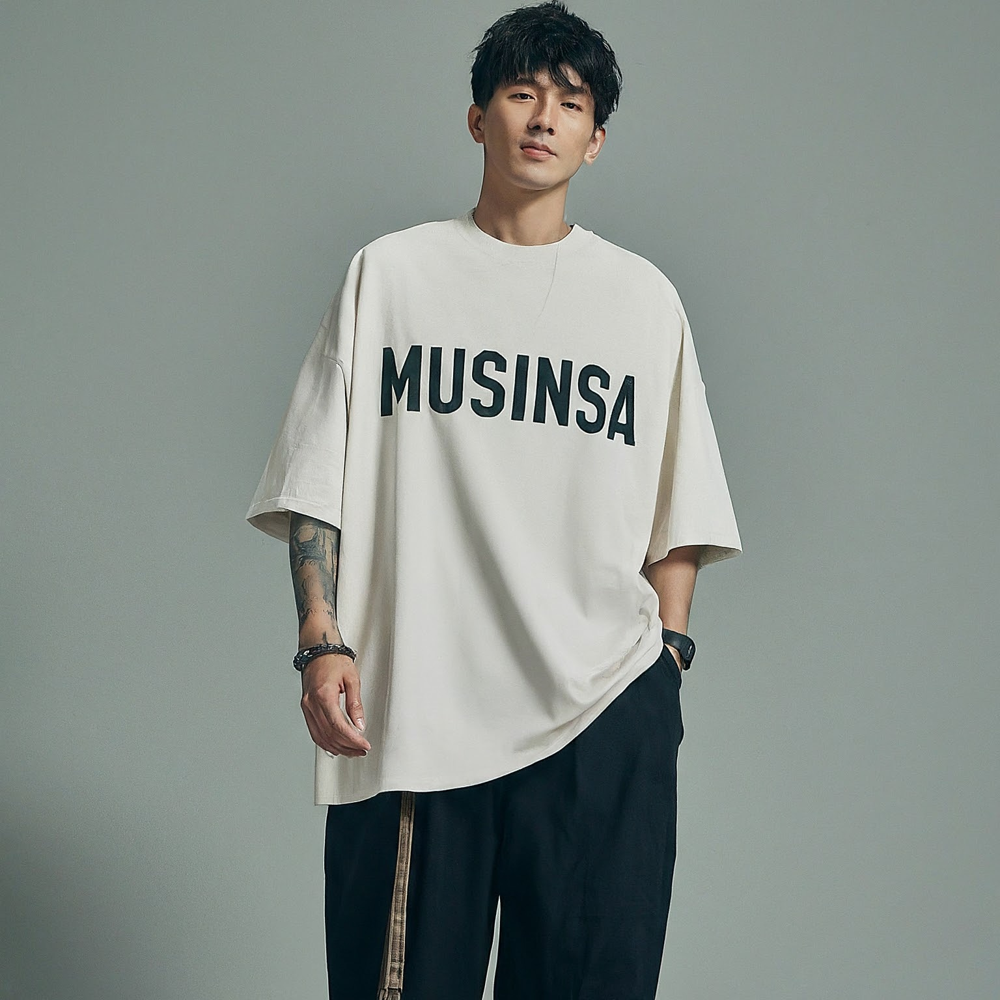

In [7]:
user_image = "face_detection_sample_01.jpg"
display(Image.open(user_image))

### face detection output

In [8]:
top, left, bottom, right = detect_faces(user_image)

face_annotations {
  bounding_poly {
    vertices {
      x: 702
      y: 33
    }
    vertices {
      x: 952
      y: 33
    }
    vertices {
      x: 952
      y: 323
    }
    vertices {
      x: 702
      y: 323
    }
  }
  fd_bounding_poly {
    vertices {
      x: 729
      y: 100
    }
    vertices {
      x: 926
      y: 100
    }
    vertices {
      x: 926
      y: 297
    }
    vertices {
      x: 729
      y: 297
    }
  }
  landmarks {
    type_: LEFT_EYE
    position {
      x: 804.862061
      y: 148.948364
      z: 0.000327110291
    }
  }
  landmarks {
    type_: RIGHT_EYE
    position {
      x: 878.125122
      y: 162.610596
      z: 4.29593658
    }
  }
  landmarks {
    type_: LEFT_OF_LEFT_EYEBROW
    position {
      x: 782.104553
      y: 127.961594
      z: 8.57654095
    }
  }
  landmarks {
    type_: RIGHT_OF_LEFT_EYEBROW
    position {
      x: 829.499512
      y: 132.24469
      z: -8.74671268
    }
  }
  landmarks {
    type_: LEFT_OF_RIGHT_EYEBROW
    pos

### a) face blur

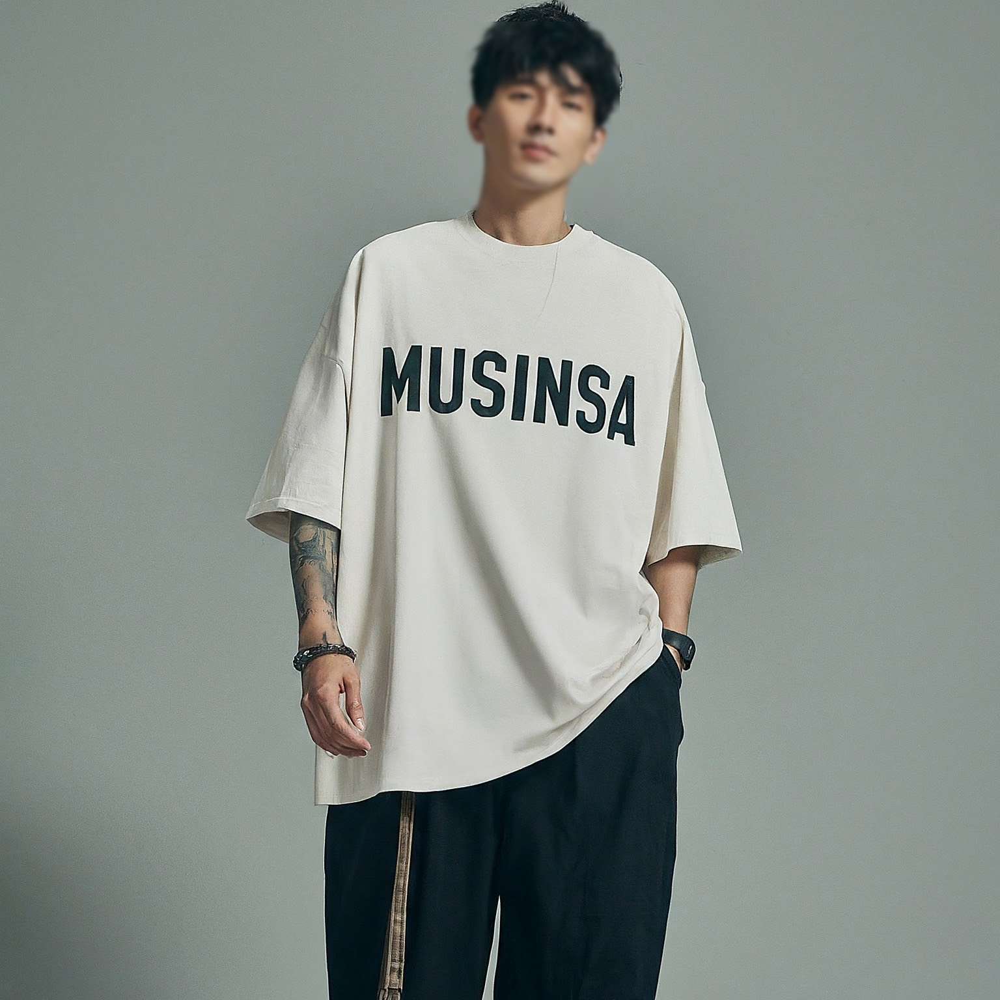

In [9]:
blurred = blur_image_area(user_image, top, left, bottom, right)
display(blurred)

### b) face mosaic

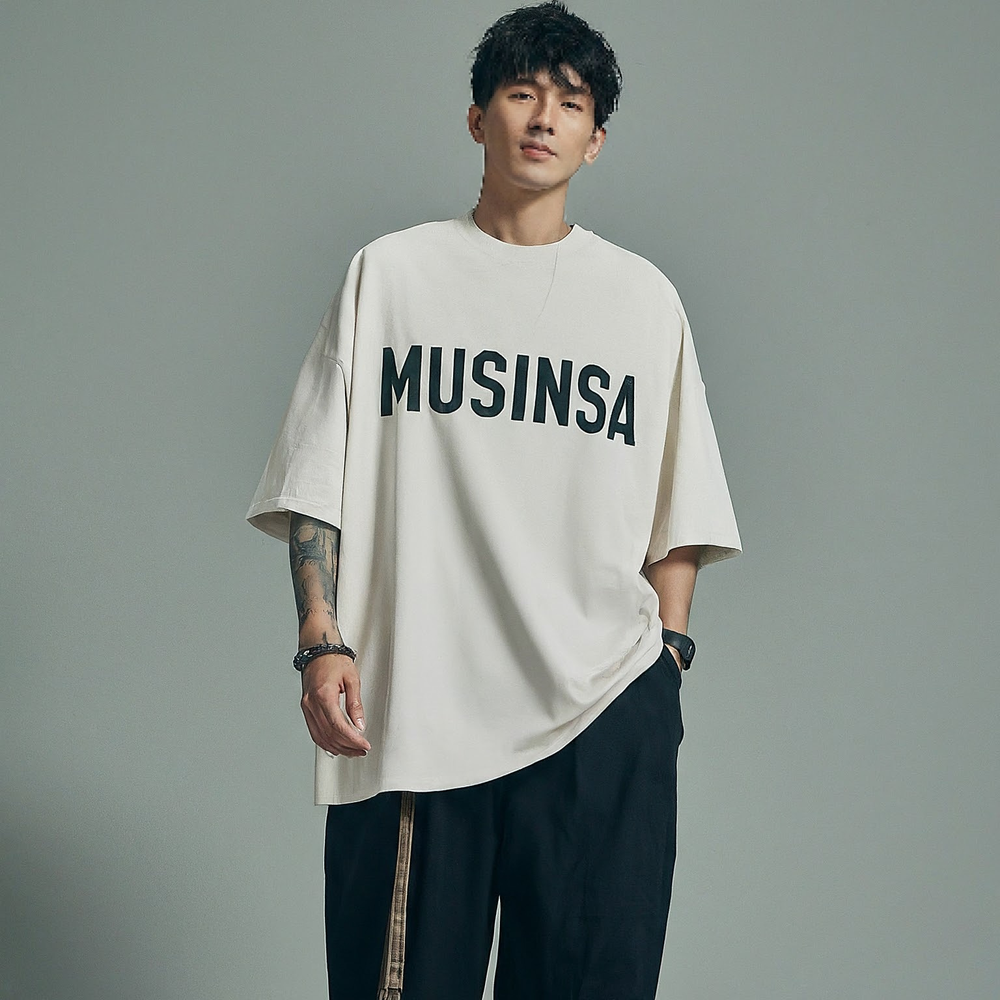

In [10]:
overlay = mosaic_image_area(user_image, top, left, bottom, right)
display(overlay)

### c) logo on face

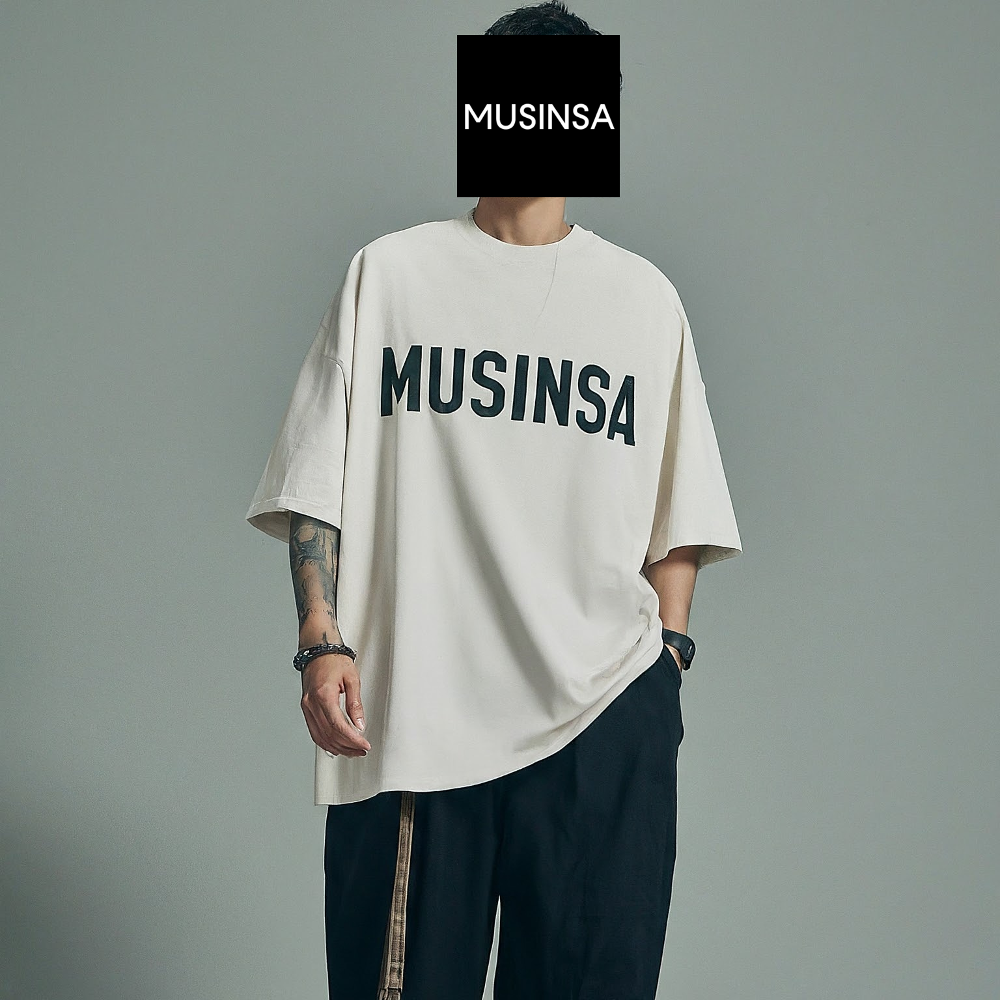

In [11]:
logo_path = "icon_logo.png"
overlay = overlay_image_area(user_image, logo_path, top, left, bottom, right)
display(overlay)

### User review image sample - 02
#### [무신사 스탠다드] 우먼즈 오버사이즈 블레이저
#### https://www.musinsa.com/app/goods/1618312

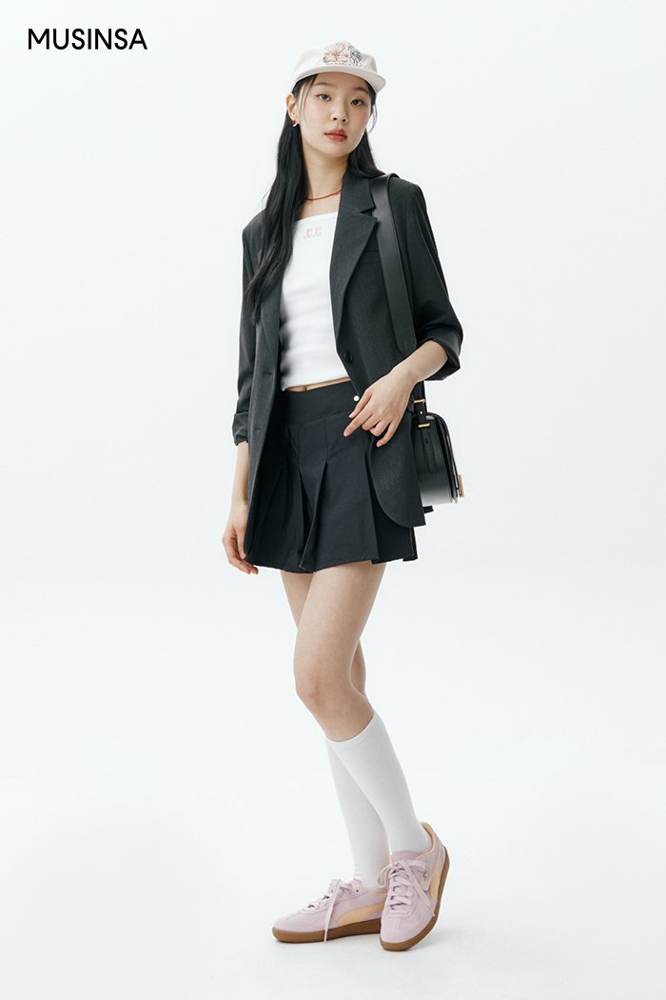

In [12]:
user_image = "face_detection_sample_02.jpg"
display(Image.open(user_image))

### face detection output

In [13]:
top, left, bottom, right = detect_faces(user_image)

face_annotations {
  bounding_poly {
    vertices {
      x: 292
      y: 39
    }
    vertices {
      x: 410
      y: 39
    }
    vertices {
      x: 410
      y: 176
    }
    vertices {
      x: 292
      y: 176
    }
  }
  fd_bounding_poly {
    vertices {
      x: 304
      y: 72
    }
    vertices {
      x: 396
      y: 72
    }
    vertices {
      x: 396
      y: 163
    }
    vertices {
      x: 304
      y: 163
    }
  }
  landmarks {
    type_: LEFT_EYE
    position {
      x: 341.023376
      y: 101.641251
      z: 0.000240802765
    }
  }
  landmarks {
    type_: RIGHT_EYE
    position {
      x: 375.13504
      y: 106.80191
      z: 5.25625706
    }
  }
  landmarks {
    type_: LEFT_OF_LEFT_EYEBROW
    position {
      x: 330.201
      y: 90.4384613
      z: 2.41245437
    }
  }
  landmarks {
    type_: RIGHT_OF_LEFT_EYEBROW
    position {
      x: 351.80307
      y: 91.8652267
      z: -4.08609104
    }
  }
  landmarks {
    type_: LEFT_OF_RIGHT_EYEBROW
    position {

### a) face blur

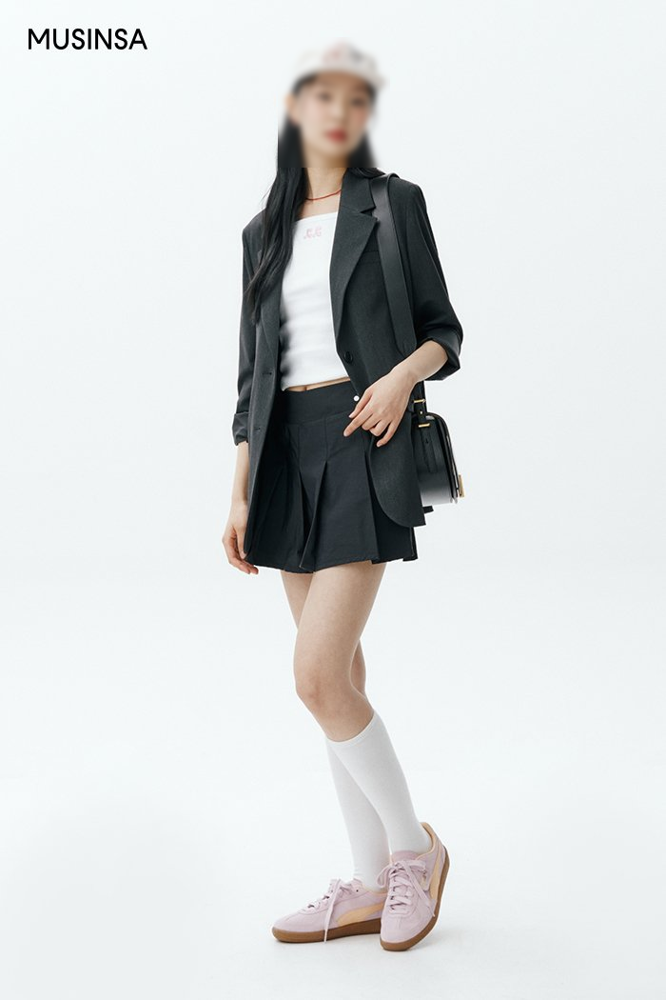

In [14]:
blurred = blur_image_area(user_image, top, left, bottom, right)
display(blurred)

### b) face mosaic

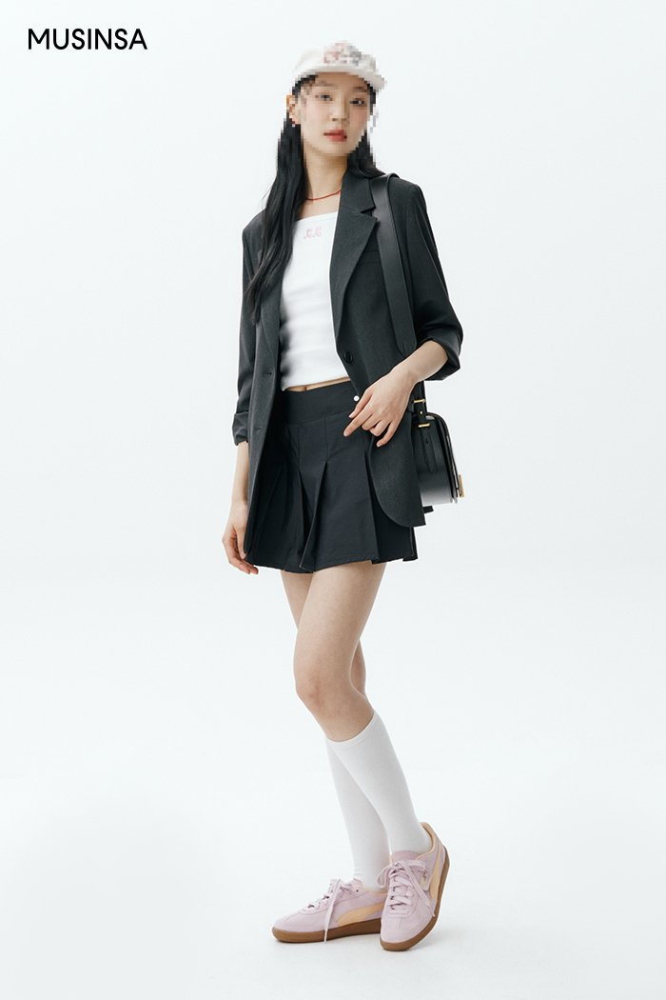

In [15]:
mosaic = mosaic_image_area(user_image, top, left, bottom, right)
display(mosaic)

### c) logo on face

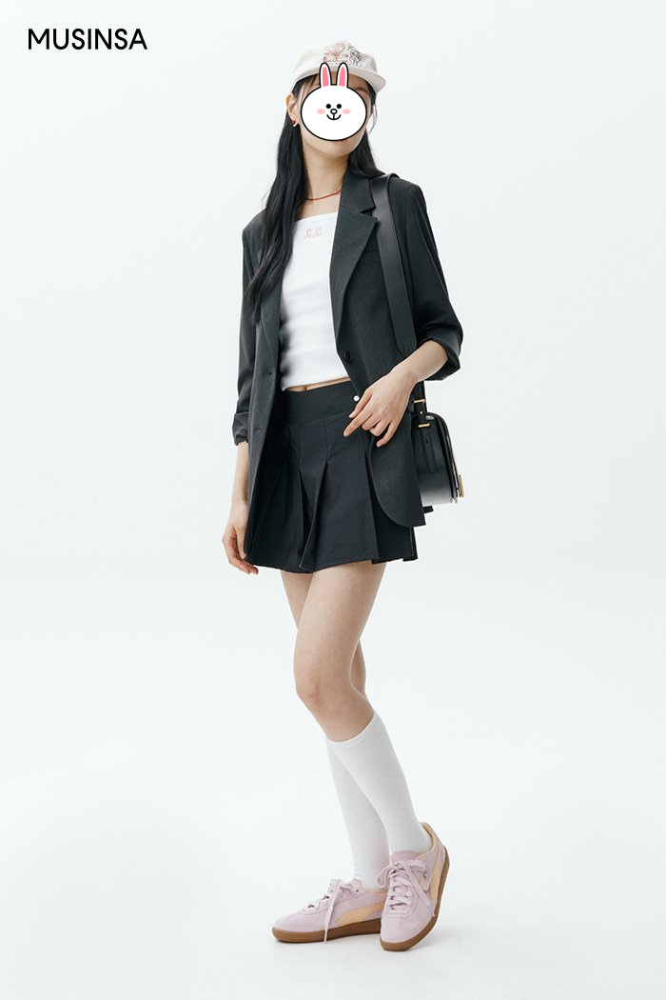

In [16]:
logo_path = "line_cony.png"
overlay = overlay_image_area(user_image, logo_path, top, left, bottom, right)
display(overlay)